In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import numpy as np
import pandas as pd
import redun
import seaborn as sns
import scanpy as sc
import anndata

import torch
import matplotlib.pyplot as plt
import matplotlib.colors as colors


from collections import defaultdict

from sams_vae.models.utils.perturbation_lightning_module import TrainConfigPerturbationLightningModule
from sams_vae.models import SAMSVAEModel, CPAVAEModel, SVAEPlusModel, ConditionalVAEModel
from sams_vae.models import SAMSVAEMeanFieldNormalGuide, SAMSVAECorrelatedNormalGuide, CPAVAENormalGuide, SVAEPlusGuide, ConditionalVAEGuide

### Before running

Run `3_aggregate_results.py` and `4_download_checkpoints.py` to generate or download metrics and checkpoints. See README for more info.

## Tables

In [3]:
results = pd.read_csv("results/replogle_results.csv")

We focus on `mask_prior_prob=0.01` for the SAMS-VAE models because 1) we are interested in sparse models (latent dim 100, prior ~1 latent effect per treatment) and 2) we find that it performs well for both SAMS-VAE correlated and mean field.

In [4]:
# compare SAMS-VAE results with different mask prior probabilities
results[(results["n_latent"] == 100) & results["model"].apply(lambda x: "sams_vae" in x)]\
        .groupby(["n_latent", "model", "guide", "mask_prior_prob", "mean_field_encoder"], dropna=False)\
        [["val/IWELBO", "test/IWELBO", "val/frac_mask_freq_geq_0.5", "ATE_pearsonr-all", "ATE_pearsonr_top20-all", "ATE_r2-all"]]\
        .agg(["mean", "std"])

val/IWELBO  \
                                                                                                      mean   
n_latent model                guide                        mask_prior_prob mean_field_encoder                
100      sams_vae_correlated" SAMSVAECorrelatedNormalGuide 0.001           False              -1758.339502   
                                                                           True               -1760.096045   
                                                           0.010           False              -1758.280884   
                                                                           True               -1759.967920   
                                                           0.100           False              -1758.157251   
                                                                           True               -1760.101514   
         sams_vae_mean_field  SAMSVAEMeanFieldNormalGuide  0.001           False              -1758.503833   
                                                                           True               -1759.795068   
                                                           0.010           False              -1758.359375   
                                                                           True               -1759.936719   
                                                           0.100           False              -1758.362036   
                                                                           True               -1760.145703   

                                                                                                         \
                                                                                                    std   
n_latent model                guide                        mask_prior_prob mean_field_encoder             
100      sams_vae_correlated" SAMSVAECorrelatedNormalGuide 0.001           False               0.069345   
                                                                           True                0.039393   
                                                           0.010           False               0.067796   
                                                                           True                0.074665   
                                                           0.100           False               0.059375   
                                                                           True                0.065851   
         sams_vae_mean_field  SAMSVAEMeanFieldNormalGuide  0.001           False               0.041484   
                                                                           True                0.111441   
                                                           0.010           False               0.069782   
                                                                           True                0.151991   
                                                           0.100           False               0.043239   
                                                                           True                0.095724   

                                                                                               test/IWELBO  \
                                                                                                      mean   
n_latent model                guide                        mask_prior_prob mean_field_encoder                
100      sams_vae_correlated" SAMSVAECorrelatedNormalGuide 0.001           False              -1756.267065   
                                                                           True               -1758.080444   
                                                           0.010           False              -1756.218408   
                                                                           True               -1757.906470   
                                                           0.100     

In [5]:
# focus on mask_prior_prob=0.01 for SAMS-VAE models in further analysis
results = results[results["mask_prior_prob"].apply(lambda x: (x == 0.01) or pd.isna(x))]

In [6]:
results[results["n_latent"] == 100]\
        .groupby(["n_latent", "model", "guide", "mask_prior_prob", "mask_beta_concentration_2", "mean_field_encoder"], dropna=False)\
        [["val/IWELBO", "test/IWELBO", "ATE_pearsonr-all", "ATE_pearsonr_top20-all", "ATE_r2-all"]]\
        .agg(["mean", "std"])\
        .sort_values(("val/IWELBO", "mean"), ascending=False)\
        .reset_index().drop_duplicates([("model",""), ("guide",""), ("mean_field_encoder", "")])

n_latent                 model                         guide  \
                                                                 
0      100  sams_vae_correlated"  SAMSVAECorrelatedNormalGuide   
1      100   sams_vae_mean_field   SAMSVAEMeanFieldNormalGuide   
2      100               cpa_vae             CPAVAENormalGuide   
3      100   sams_vae_mean_field   SAMSVAEMeanFieldNormalGuide   
4      100  sams_vae_correlated"  SAMSVAECorrelatedNormalGuide   
5      100               cpa_vae             CPAVAENormalGuide   
6      100                 svae+                 SVAEPlusGuide   
9      100       conditional_vae           ConditionalVAEGuide   

  mask_prior_prob mask_beta_concentration_2 mean_field_encoder   val/IWELBO  \
                                                                       mean   
0            0.01                       NaN              False -1758.280884   
1            0.01                       NaN              False -1758.359375   
2             NaN                       NaN              False -1758.666309   
3            0.01                       NaN               True -1759.936719   
4            0.01                       NaN               True -1759.967920   
5             NaN                       NaN               True -1762.263647   
6             NaN                       2.0                NaN -1763.492871   
9             NaN                       NaN                NaN -1768.234570   

             test/IWELBO           ATE_pearsonr-all            \
        std         mean       std             mean       std   
0  0.067796 -1756.218408  0.071343         0.746518  0.029158   
1  0.069782 -1756.272314  0.071070         0.742307  0.015607   
2  0.139840 -1756.571997  0.139090         0.568635  0.005247   
3  0.151991 -1757.856201  0.125913         0.289026  0.021415   
4  0.074665 -1757.906470  0.071565         0.314778  0.018424   
5  0.204368 -1760.141772  0.198272         0.487956  0.018799   
6  0.049198 -1761.415796  0.055619         0.607322  0.017061   
9  0.185733 -1766.097534  0.171559         0.753579  0.005399   

  ATE_pearsonr_top20-all           ATE_r2-all            
                    mean       std       mean       std  
0               0.893100  0.010946   0.537418  0.033821  
1               0.889088  0.007060   0.529599  0.020844  
2               0.861607  0.002908   0.245599  0.017116  
3               0.507167  0.018194   0.070964  0.008331  
4               0.527748  0.017597   0.082655  0.007804  
5               0.715433  0.023088   0.195616  0.009206  
6               0.825149  0.005963   0.364059  0.019928  
9               0.920004  0.003091   0.557212  0.008575

In [7]:
results[results["n_latent"] == 200]\
        .groupby(["n_latent", "model", "guide", "mask_prior_prob", "mask_beta_concentration_2", "mean_field_encoder"], dropna=False)\
        [["val/IWELBO", "test/IWELBO", "ATE_pearsonr-all", "ATE_pearsonr_top20-all", "ATE_r2-all"]]\
        .agg(["mean", "std"])\
        .sort_values(("val/IWELBO", "mean"), ascending=False)\
        .reset_index().drop_duplicates([("model",""), ("guide",""), ("mean_field_encoder", "")])

n_latent                 model                         guide  \
                                                                 
0      200   sams_vae_mean_field   SAMSVAEMeanFieldNormalGuide   
1      200  sams_vae_correlated"  SAMSVAECorrelatedNormalGuide   
2      200               cpa_vae             CPAVAENormalGuide   
3      200   sams_vae_mean_field   SAMSVAEMeanFieldNormalGuide   
4      200  sams_vae_correlated"  SAMSVAECorrelatedNormalGuide   
5      200               cpa_vae             CPAVAENormalGuide   
6      200                 svae+                 SVAEPlusGuide   
9      200       conditional_vae           ConditionalVAEGuide   

  mask_prior_prob mask_beta_concentration_2 mean_field_encoder   val/IWELBO  \
                                                                       mean   
0            0.01                       NaN              False -1758.116650   
1            0.01                       NaN              False -1758.389697   
2             NaN                       NaN              False -1759.258936   
3            0.01                       NaN               True -1759.716479   
4            0.01                       NaN               True -1760.017163   
5             NaN                       NaN               True -1762.984839   
6             NaN                       2.0                NaN -1763.341626   
9             NaN                       NaN                NaN -1768.101196   

             test/IWELBO           ATE_pearsonr-all            \
        std         mean       std             mean       std   
0  0.049489 -1756.026636  0.041212         0.751560  0.010627   
1  0.054809 -1756.359692  0.019472         0.751759  0.014230   
2  0.331005 -1757.169653  0.343087         0.544836  0.026744   
3  0.060421 -1757.637524  0.082905         0.303221  0.025742   
4  0.093810 -1757.985718  0.093557         0.315238  0.019803   
5  0.283205 -1760.881812  0.292336         0.498993  0.020325   
6  0.254099 -1761.248340  0.221965         0.626412  0.023223   
9  0.199511 -1765.948560  0.190062         0.756022  0.006545   

  ATE_pearsonr_top20-all           ATE_r2-all            
                    mean       std       mean       std  
0               0.893676  0.004608   0.540308  0.012453  
1               0.896206  0.006369   0.542939  0.016928  
2               0.848820  0.010920   0.190637  0.051311  
3               0.528417  0.019448   0.075702  0.008700  
4               0.544758  0.018152   0.082068  0.007981  
5               0.733640  0.011868   0.208989  0.011810  
6               0.835492  0.007797   0.386582  0.026903  
9               0.922140  0.004708   0.561753  0.009457

## Replogle figures

In [8]:
def load_checkpoint(checkpoint_path: str):
    lightning_module = TrainConfigPerturbationLightningModule.load_from_checkpoint(
        checkpoint_path, map_location="cpu",
    )
    return lightning_module

In [9]:
checkpoint_paths = redun.file.glob.glob("results/checkpoints/*/checkpoints/*.ckpt", recursive=True)

In [10]:
ls results/checkpoints/balmy-sweep-2/checkpoints/

best-epoch=207-step=30992-val_loss=1772.71.ckpt


In [11]:
lightning_modules = [load_checkpoint(checkpoint_paths[i]) for i in range(len(checkpoint_paths))]

In [12]:
for lightning_module in lightning_modules:
    mf = lightning_module.config["guide_kwargs"].get("mean_field_encoder", "NA")
    print(lightning_module.config["data_module"], lightning_module.config["model"], lightning_module.config["guide"], "mean field: ", mf)

ReplogleDataModule SAMSVAEModel SAMSVAEMeanFieldNormalGuide mean field:  True
ReplogleDataModule CPAVAEModel CPAVAENormalGuide mean field:  False
ReplogleDataModule SAMSVAEModel SAMSVAEMeanFieldNormalGuide mean field:  False
ReplogleDataModule SAMSVAEModel SAMSVAEMeanFieldNormalGuide mean field:  True
ReplogleDataModule SAMSVAEModel SAMSVAECorrelatedNormalGuide mean field:  True
ReplogleDataModule CPAVAEModel CPAVAENormalGuide mean field:  True
ReplogleDataModule SVAEPlusModel SVAEPlusGuide mean field:  NA
ReplogleDataModule SAMSVAEModel SAMSVAEMeanFieldNormalGuide mean field:  False
ReplogleDataModule SAMSVAEModel SAMSVAEMeanFieldNormalGuide mean field:  True
ReplogleDataModule SAMSVAEModel SAMSVAEMeanFieldNormalGuide mean field:  False
ReplogleDataModule SAMSVAEModel SAMSVAECorrelatedNormalGuide mean field:  False
ReplogleDataModule ConditionalVAEModel ConditionalVAEGuide mean field:  NA
ReplogleDataModule SAMSVAEModel SAMSVAECorrelatedNormalGuide mean field:  False
ReplogleDataModul

In [13]:
def get_name_from_config(config):
    if config["model"] == "SAMSVAEModel":
        name = "sams_vae"
    elif config["model"] == "CPAVAEModel":
        name = "cpa_vae"
    elif config["model"] == "SVAEPlusModel":
        name = "svae_plus"
    else:
        name = "conditional_vae"
        
    if "MeanField" in config["guide"]:
        name += "_mean_field_embedding"
        
    mf = lightning_module.config["guide_kwargs"].get("mean_field_encoder", "NA")
    if mf == True:
        name += "_mean_field_encoder"
    return name

In [14]:
lightning_module_dict = {}
for lightning_module in lightning_modules:
    name = get_name_from_config(lightning_module.config)
    mask_prior_prob = lightning_module.config["model_kwargs"].get("mask_prior_prob")
    if (not pd.isna(mask_prior_prob)) and mask_prior_prob != 0.01:
        continue
    lightning_module_dict[name] = lightning_module
    print(name, mask_prior_prob)

cpa_vae None
sams_vae_mean_field_embedding_mean_field_encoder 0.01
cpa_vae_mean_field_encoder None
svae_plus None
sams_vae_mean_field_embedding 0.01
sams_vae 0.01
conditional_vae None
sams_vae_mean_field_encoder 0.01


In [15]:
def get_latent_vars(lightning_module):
    latent_vars = {}
    
    model = lightning_module.loss_module.model
    guide = lightning_module.loss_module.guide
    
    with torch.no_grad():
        guide_dists, guide_samples = lightning_module.loss_module.guide()
    
    if type(guide) in (SAMSVAEMeanFieldNormalGuide, SAMSVAECorrelatedNormalGuide):
        latent_vars["mask_probs"] = guide_dists["q_mask"].probs.detach().cpu().squeeze().numpy()
        latent_vars["E_mean"] = guide_dists["q_E"].mean.detach().cpu().squeeze().numpy()
    elif type(guide) == CPAVAENormalGuide:
        latent_vars["mask_probs"] = None
        latent_vars["E_mean"] = guide_dists["q_E"].mean.detach().cpu().squeeze().numpy()
    elif type(guide) == SVAEPlusGuide:
        latent_vars["mask_probs"] = guide_dists["q_mask_prob"].v.detach().cpu().squeeze().numpy()
        latent_vars["E_mean"] = lightning_module.loss_module.model.action_prior_mean.detach().cpu().squeeze().numpy()
    elif type(guide) == ConditionalVAEGuide:
        latent_vars["mask_probs"] = None
        latent_vars["E_mean"] = None
        
    return latent_vars

In [16]:
latent_var_dict = {name: get_latent_vars(lm) for name, lm in lightning_module_dict.items()}

In [17]:
latent_var_dict.keys()

dict_keys(['cpa_vae', 'sams_vae_mean_field_embedding_mean_field_encoder', 'cpa_vae_mean_field_encoder', 'svae_plus', 'sams_vae_mean_field_embedding', 'sams_vae', 'conditional_vae', 'sams_vae_mean_field_encoder'])

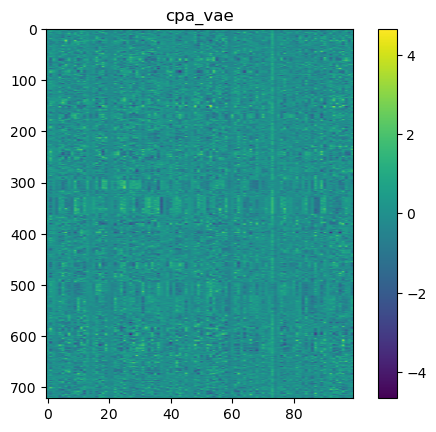

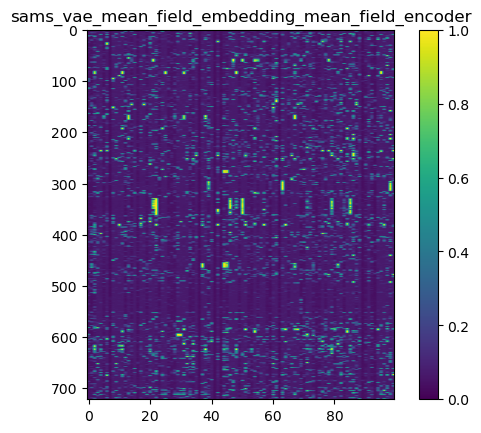

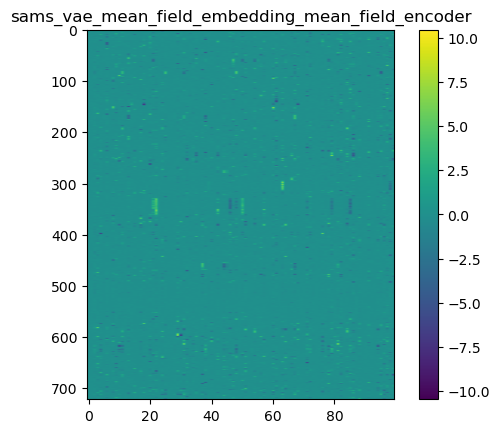

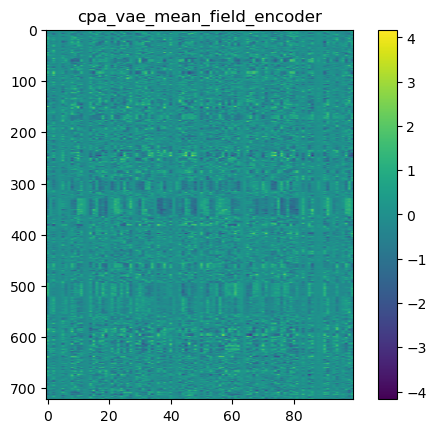

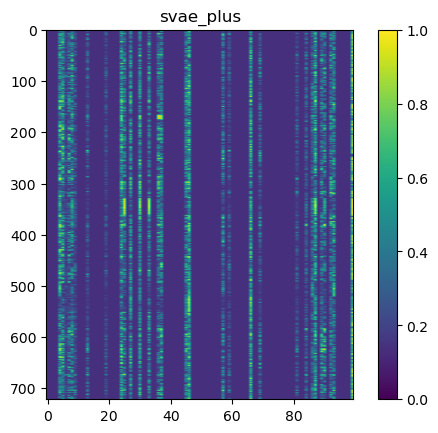

...

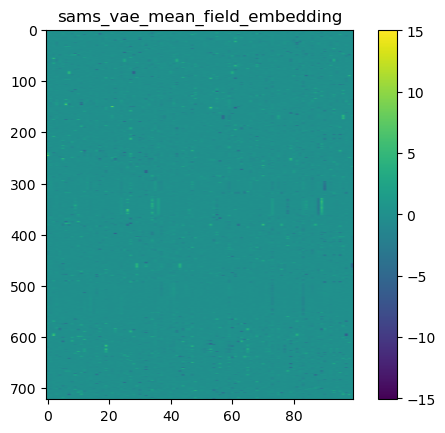

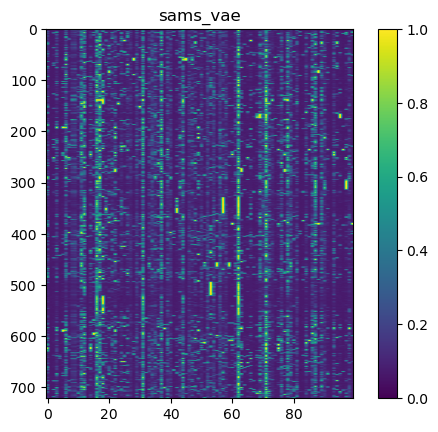

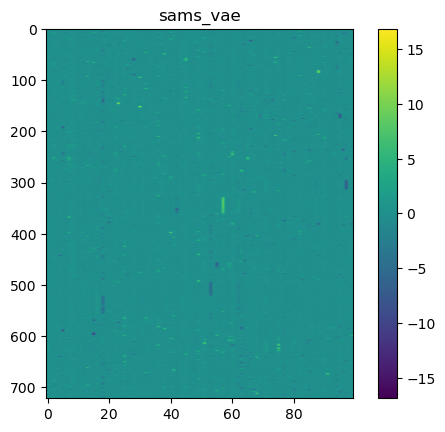

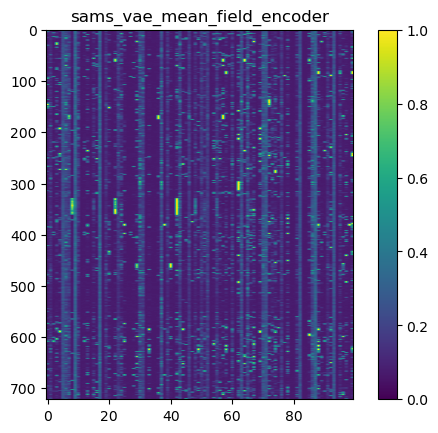

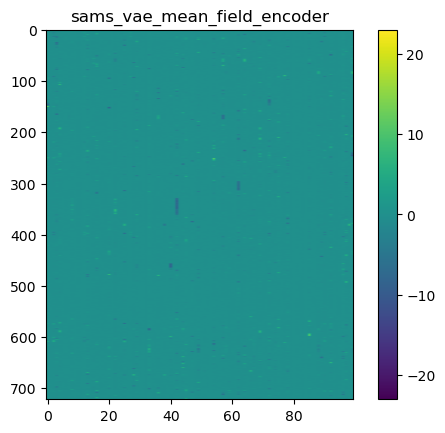

In [18]:
for k in latent_var_dict:
    mask_probs = latent_var_dict[k]["mask_probs"]
    E_mean = latent_var_dict[k]["E_mean"]
    
    if mask_probs is not None:
        plt.title(k)
        plt.imshow(mask_probs, vmin=0, vmax=1, aspect=1/6)
        plt.colorbar()
        plt.show(plt.gcf())
        plt.close()
        
    if E_mean is not None:
        plt.title(k)
        plt.imshow(E_mean, aspect=1/6, norm=colors.CenteredNorm())
        plt.colorbar()
        plt.show(plt.gcf())
        plt.close()

In [19]:
data_module = lightning_modules[0].get_data_module()

In [20]:
# annotate treatments with pathways from Replogle et al.
t_var = data_module.get_d_var_info().copy()

t_var["i"] = np.arange(t_var.shape[0])
t_var["gene"] = [idx.split("_")[0] for idx in t_var.index]

pathway_map = {}
for k, v in data_module.adata.uns["pathways"].items():
    for gene in v:
        pathway_map[gene] = k
        
t_var["pathway"] = t_var["gene"].apply(lambda x: pathway_map.get(x))

t_var["pathway"].value_counts(dropna=False)

pathway
None                          377
S40_RIBOSOMAL_UNIT            101
S60_RIBOSOMAL_UNIT             56
S39_RIBOSOMAL_UNIT             44
SPLICEOSOME                    38
MT_PROTEIN_TRANSLOCATION       37
MEDIATOR_COMPLEX               26
NUCLEOTIDE_EXCISION_REPAIR     23
EXOSOME                        20
Name: count, dtype: int64

In [21]:
# info to sort embeddings by pathway
sorted_pathways = t_var.dropna(subset=["pathway"]).sort_values(["pathway", "gene"])
sorted_pathways["j"] = np.arange(sorted_pathways.shape[0])
idx = sorted_pathways["i"].to_numpy()
pathway_divisions = sorted_pathways.dropna(subset=["pathway"]).sort_values(["pathway", "gene"]).drop_duplicates("pathway")

In [22]:
pathway_divisions

cell_barcode,i,gene,pathway,j
CAMTA2_-_4890571.23-P1P2|CAMTA2_-_4890543.23-P1P2,48,CAMTA2,EXOSOME,0
ADAM10_+_59041886.23-P1P2|ADAM10_-_59041703.23-P1P2,11,ADAM10,MEDIATOR_COMPLEX,20
AARS_+_70323362.23-P1P2|AARS_-_70323332.23-P1P2,2,AARS,MT_PROTEIN_TRANSLOCATION,46
C1QBP_-_5342366.23-P1P2|C1QBP_-_5342105.23-P1P2,43,C1QBP,NUCLEOTIDE_EXCISION_REPAIR,83
AARS2_+_44281027.23-P1P2|AARS2_+_44281044.23-P1P2,1,AARS2,S39_RIBOSOMAL_UNIT,106
AAR2_-_34824434.23-P1P2|AAR2_+_34824488.23-P1P2,0,AAR2,S40_RIBOSOMAL_UNIT,150
ABCF1_+_30539238.23-P1|ABCF1_+_30539469.23-P1,4,ABCF1,S60_RIBOSOMAL_UNIT,251
CLNS1A_-_77348773.23-P1P2|CLNS1A_-_77348782.23-P1P2,76,CLNS1A,SPLICEOSOME,307


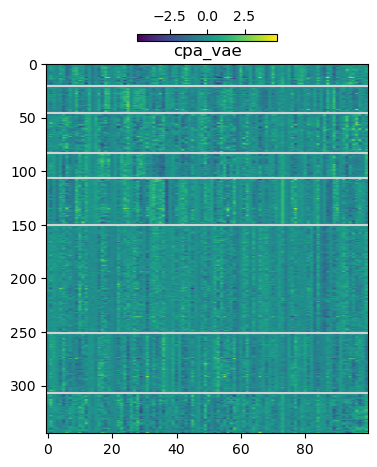

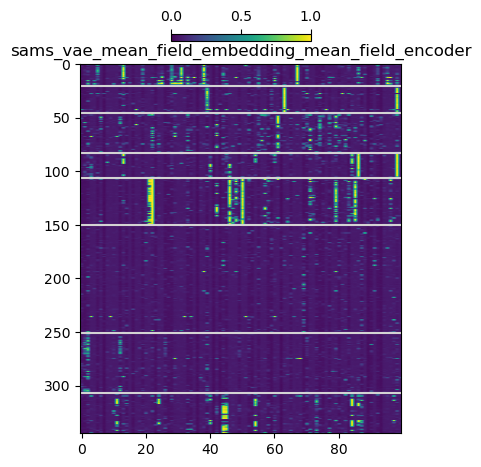

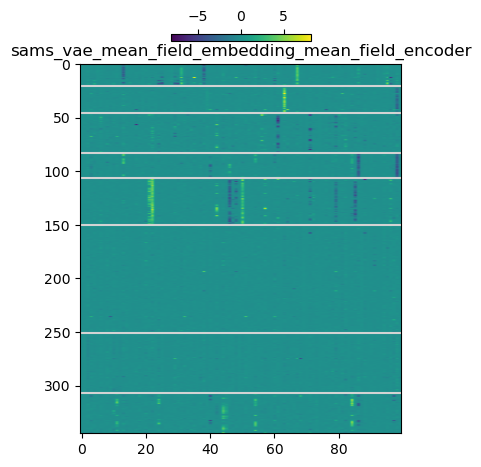

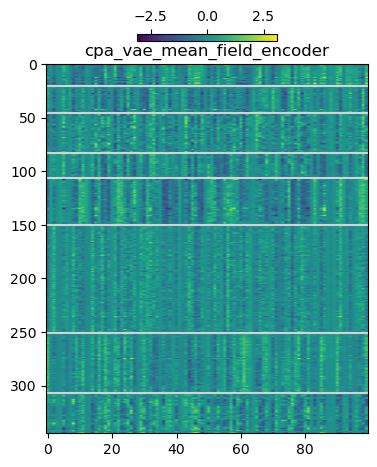

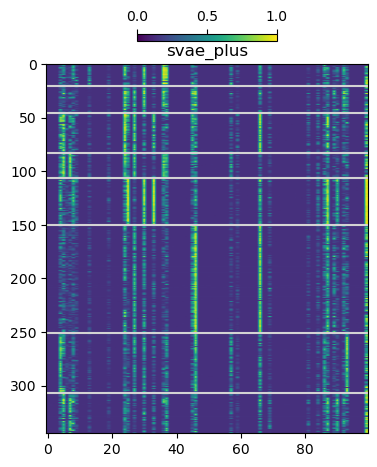

...

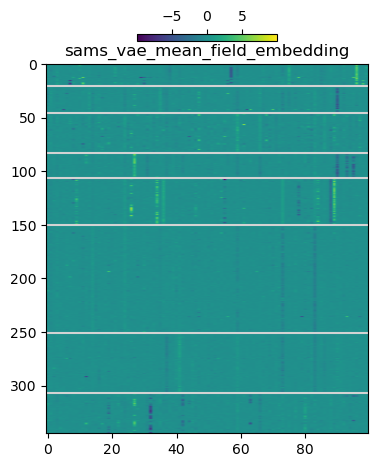

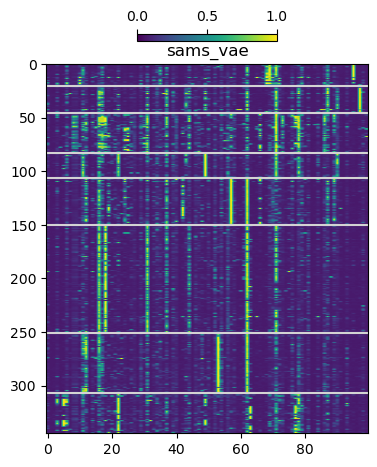

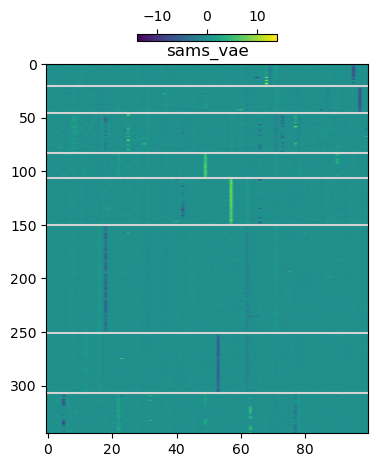

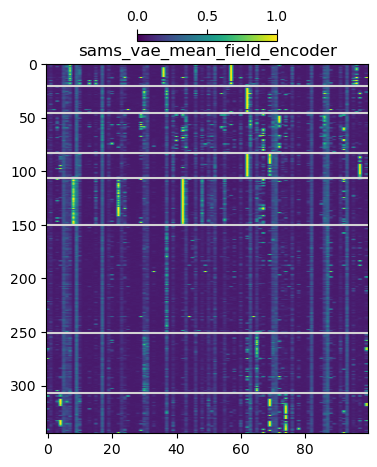

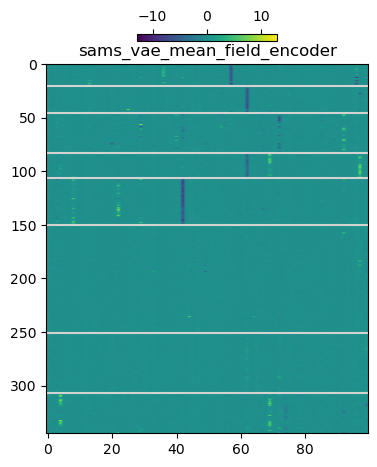

In [23]:
for k in latent_var_dict:
    mask_probs = latent_var_dict[k]["mask_probs"]
    E_mean = latent_var_dict[k]["E_mean"]
    
    if mask_probs is not None:
        plt.figure(figsize=(6,6))
        plt.title(k)
        plt.imshow(mask_probs[idx], vmin=0, vmax=1, aspect=1/3)
        for j in pathway_divisions["j"]:
            if j == 0:
                continue
            plt.axhline(y=j, c="lightgray")
        plt.colorbar(location="top", shrink=0.3)
        plt.show(plt.gcf())
        plt.close()
        
    if E_mean is not None:
        plt.figure(figsize=(6,6))
        plt.title(k)
        plt.imshow(E_mean[idx], aspect=1/3, norm=colors.CenteredNorm())
        for j in pathway_divisions["j"]:
            if j == 0:
                continue
            plt.axhline(y=j, c="lightgray")
        plt.colorbar(location="top", shrink=0.3)
        plt.show(plt.gcf())
        plt.close()

cpa_vae


/Users/michaelbereket/opt/miniconda3/envs/sams_vae3/lib/python3.9/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/Users/michaelbereket/opt/miniconda3/envs/sams_vae3/lib/python3.9/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


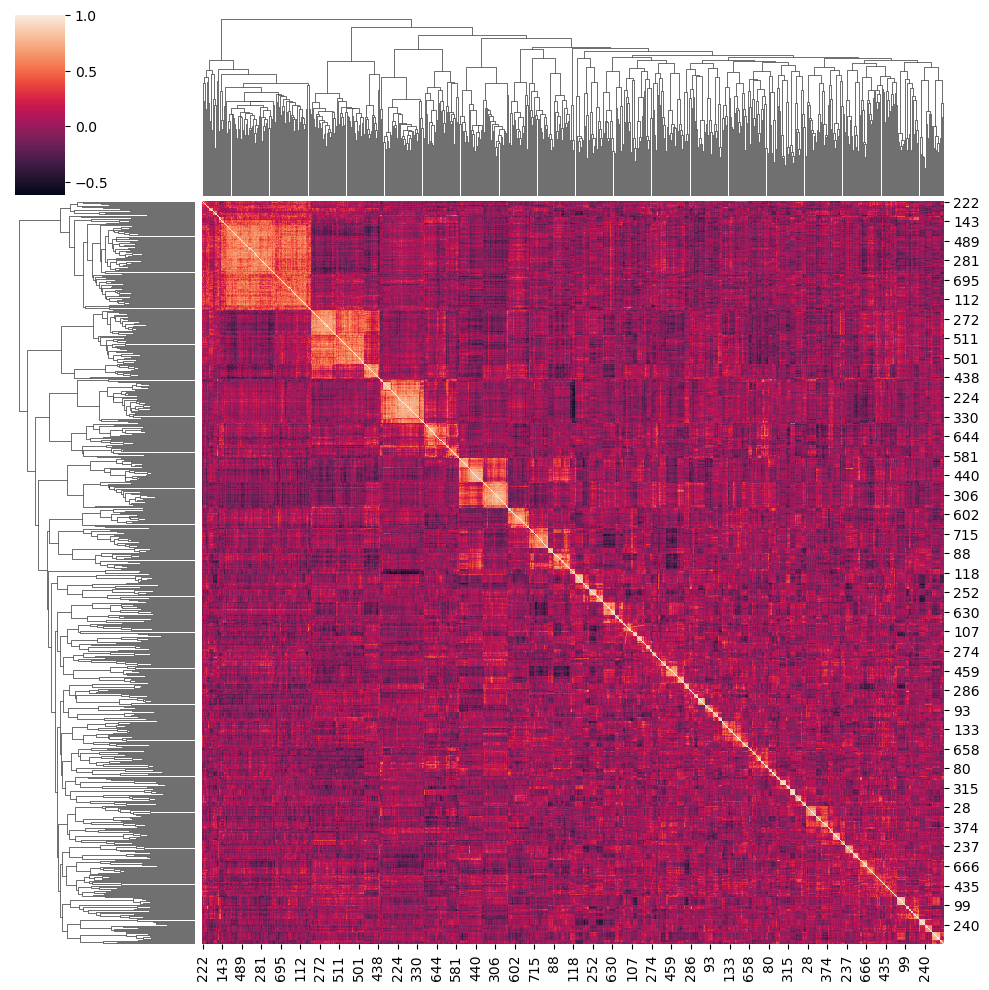

sams_vae_mean_field_embedding_mean_field_encoder


/Users/michaelbereket/opt/miniconda3/envs/sams_vae3/lib/python3.9/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/Users/michaelbereket/opt/miniconda3/envs/sams_vae3/lib/python3.9/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


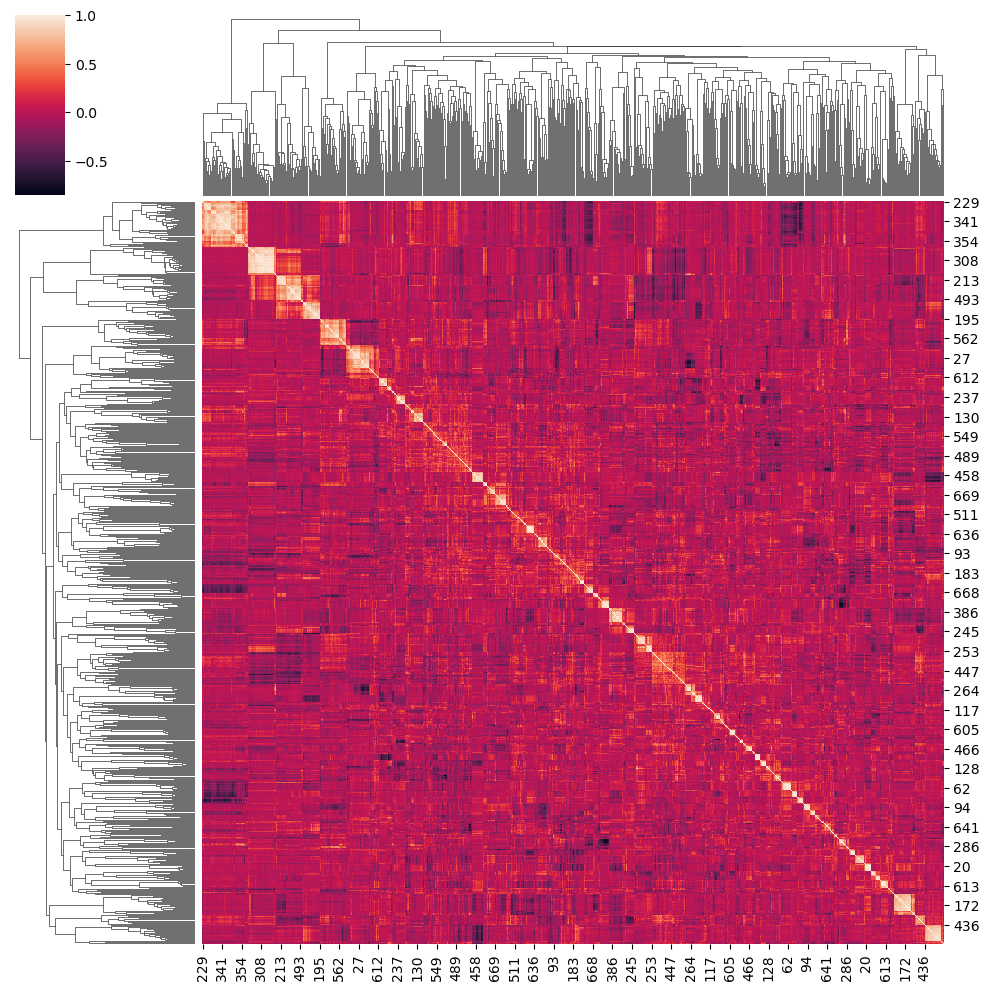

cpa_vae_mean_field_encoder


/Users/michaelbereket/opt/miniconda3/envs/sams_vae3/lib/python3.9/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/Users/michaelbereket/opt/miniconda3/envs/sams_vae3/lib/python3.9/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


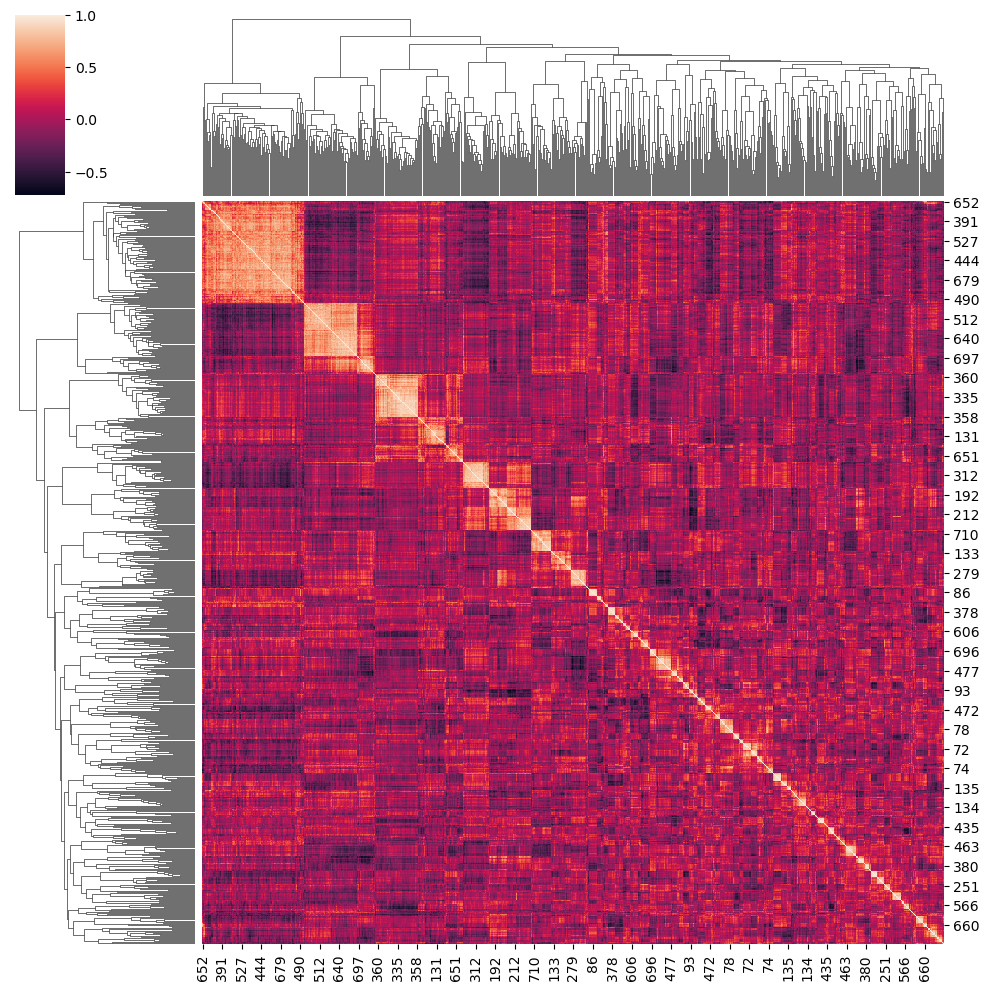

svae_plus


/Users/michaelbereket/opt/miniconda3/envs/sams_vae3/lib/python3.9/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/Users/michaelbereket/opt/miniconda3/envs/sams_vae3/lib/python3.9/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


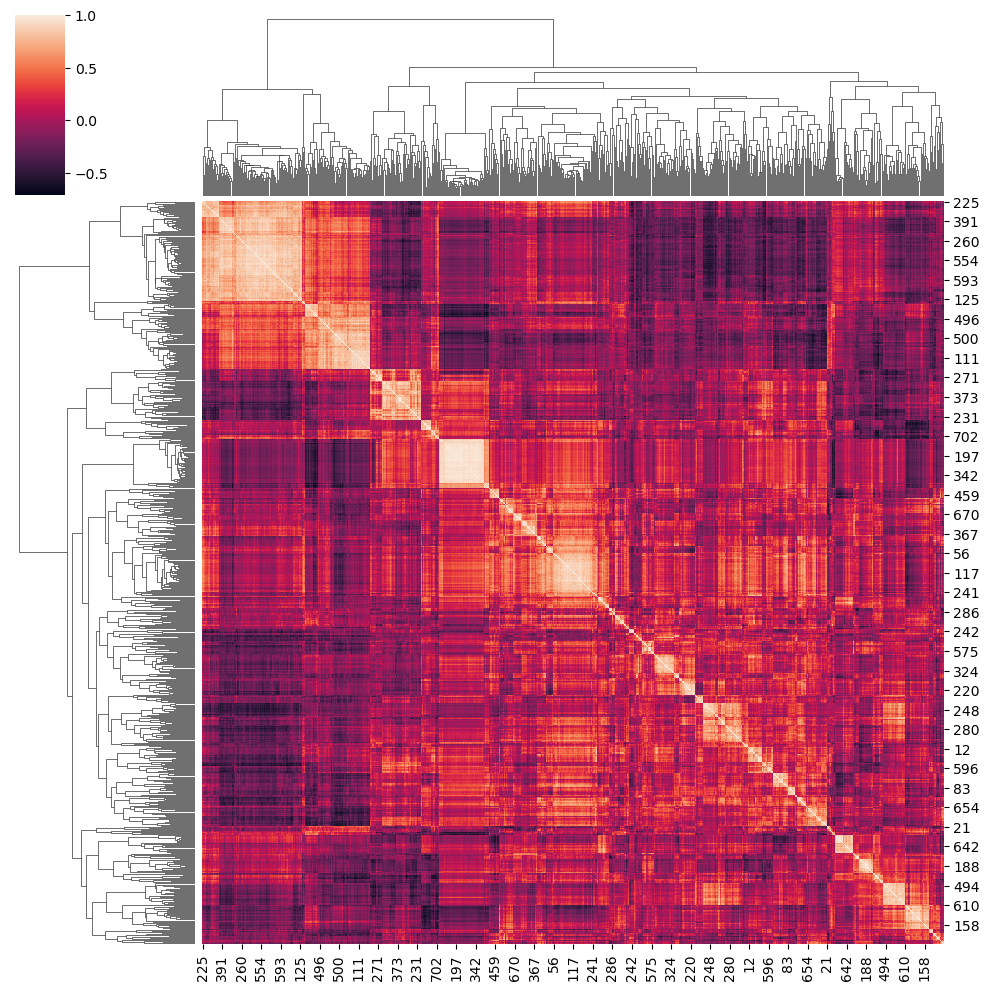

sams_vae_mean_field_embedding


/Users/michaelbereket/opt/miniconda3/envs/sams_vae3/lib/python3.9/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/Users/michaelbereket/opt/miniconda3/envs/sams_vae3/lib/python3.9/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


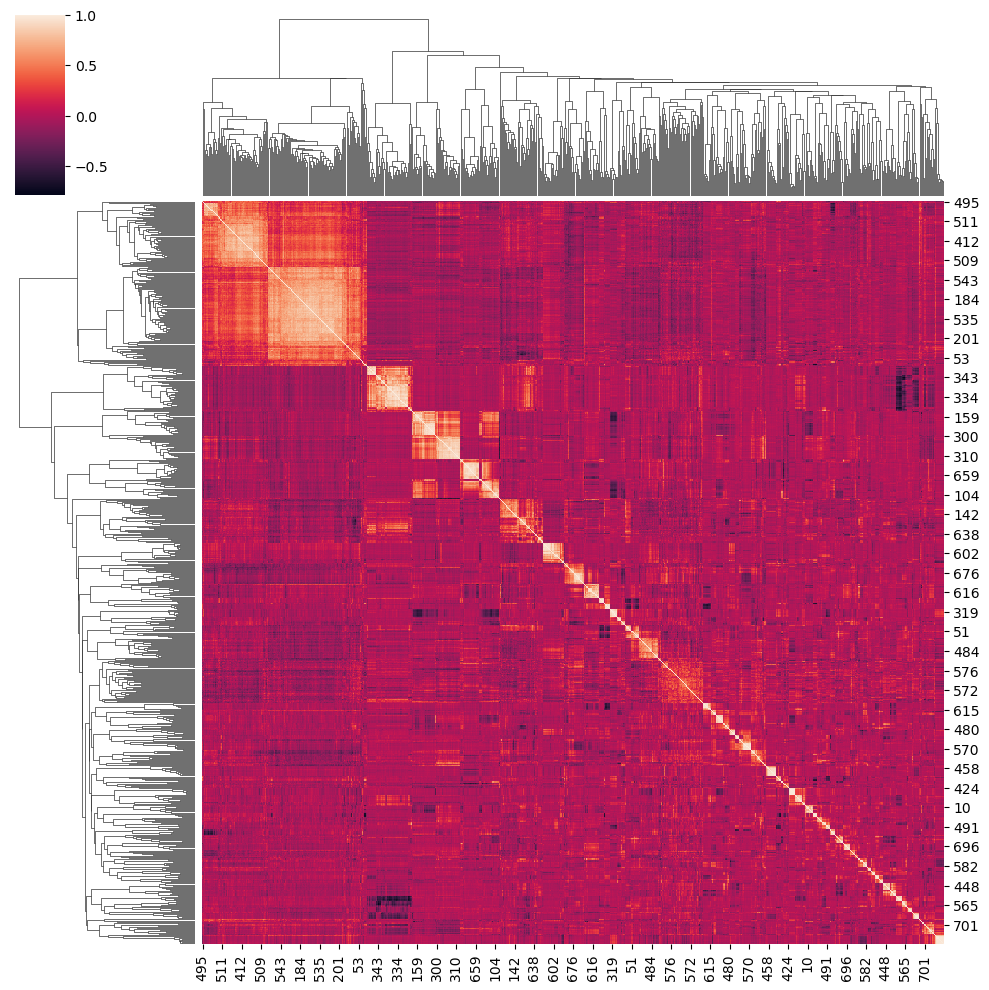

sams_vae


/Users/michaelbereket/opt/miniconda3/envs/sams_vae3/lib/python3.9/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/Users/michaelbereket/opt/miniconda3/envs/sams_vae3/lib/python3.9/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


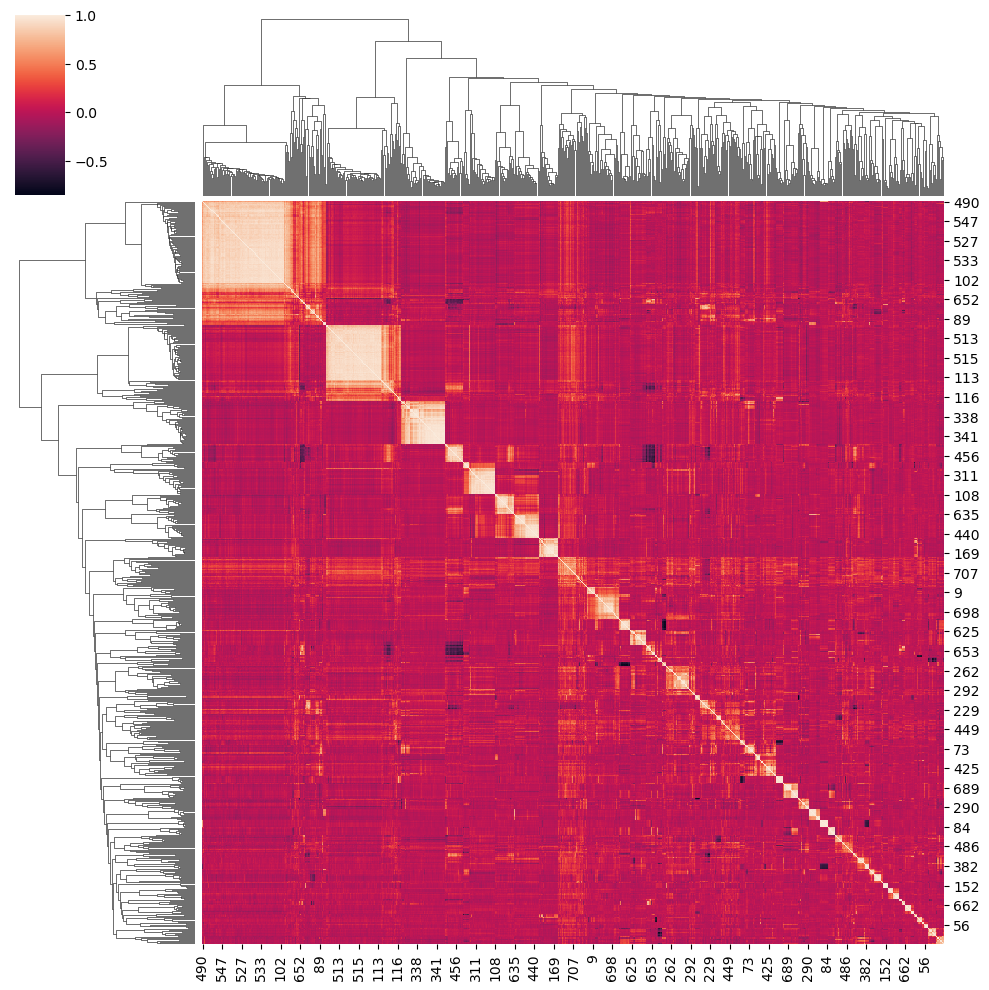

conditional_vae
sams_vae_mean_field_encoder


/Users/michaelbereket/opt/miniconda3/envs/sams_vae3/lib/python3.9/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/Users/michaelbereket/opt/miniconda3/envs/sams_vae3/lib/python3.9/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


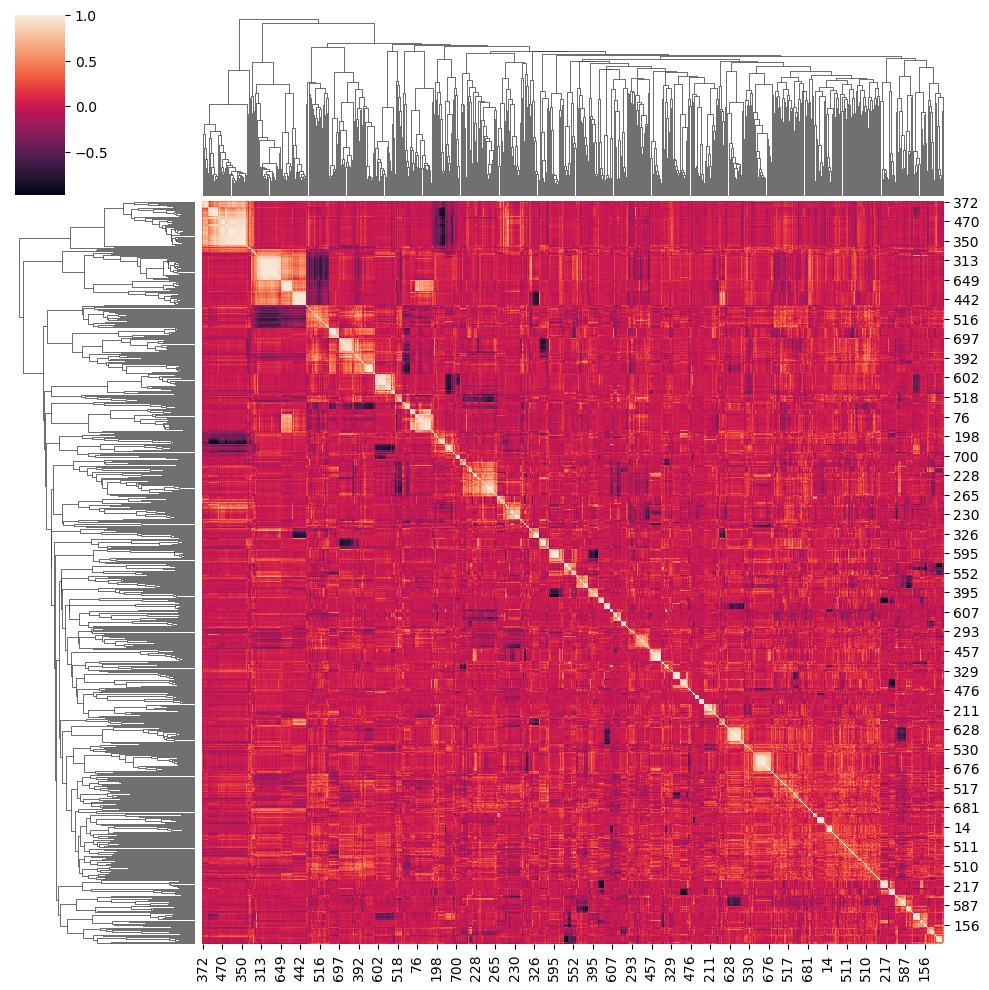

In [24]:
for k in latent_var_dict:
    print(k)
    if latent_var_dict[k]["E_mean"] is not None:
        sns.clustermap(np.corrcoef(latent_var_dict[k]["E_mean"]))
        plt.show(plt.gcf())
        plt.close()

         Falling back to preprocessing with `sc.pp.pca` and default params.


/Users/michaelbereket/opt/miniconda3/envs/sams_vae3/lib/python3.9/site-packages/anndata/_core/anndata.py:522: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  warnings.warn(
/Users/michaelbereket/opt/miniconda3/envs/sams_vae3/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1207: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):
/Users/michaelbereket/opt/miniconda3/envs/sams_vae3/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1216: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/michaelbereket/opt/miniconda3/envs/sams_vae3/lib/python3.9/site-

<Figure size 500x500 with 0 Axes>

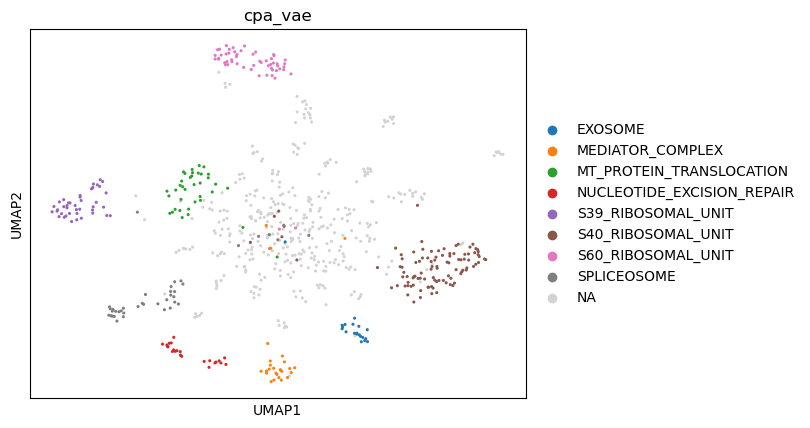

<Figure size 640x480 with 0 Axes>

         Falling back to preprocessing with `sc.pp.pca` and default params.


/Users/michaelbereket/opt/miniconda3/envs/sams_vae3/lib/python3.9/site-packages/anndata/_core/anndata.py:522: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  warnings.warn(
/Users/michaelbereket/opt/miniconda3/envs/sams_vae3/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1207: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):
/Users/michaelbereket/opt/miniconda3/envs/sams_vae3/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1216: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/michaelbereket/opt/miniconda3/envs/sams_vae3/lib/python3.9/site-

<Figure size 500x500 with 0 Axes>

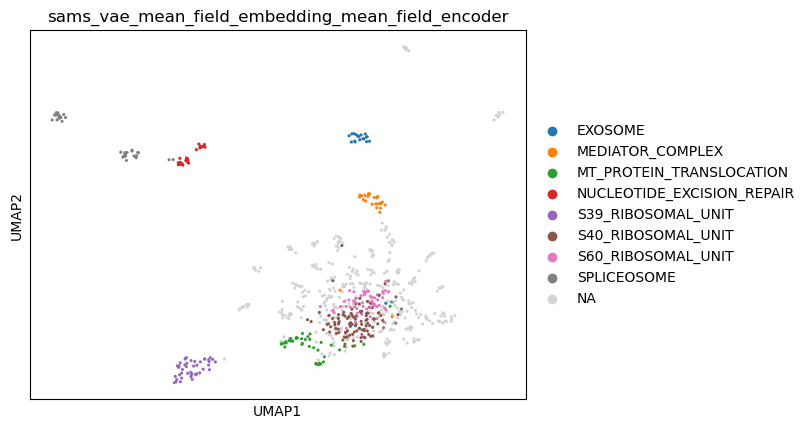

<Figure size 640x480 with 0 Axes>

         Falling back to preprocessing with `sc.pp.pca` and default params.


/Users/michaelbereket/opt/miniconda3/envs/sams_vae3/lib/python3.9/site-packages/anndata/_core/anndata.py:522: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  warnings.warn(
/Users/michaelbereket/opt/miniconda3/envs/sams_vae3/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1207: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):
/Users/michaelbereket/opt/miniconda3/envs/sams_vae3/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1216: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/michaelbereket/opt/miniconda3/envs/sams_vae3/lib/python3.9/site-

<Figure size 500x500 with 0 Axes>

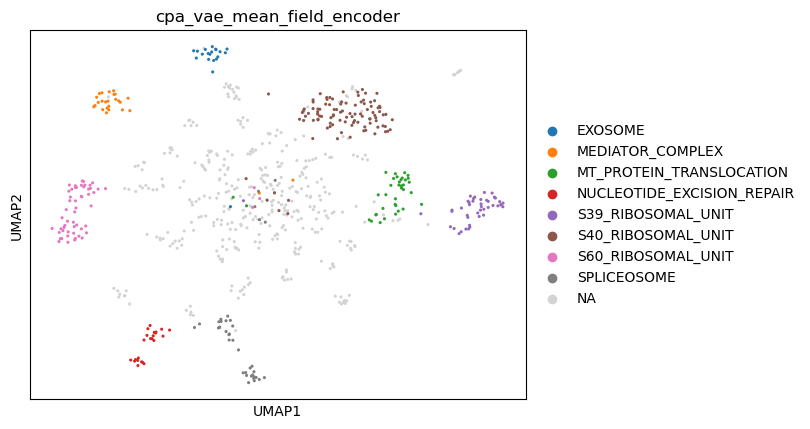

<Figure size 640x480 with 0 Axes>

         Falling back to preprocessing with `sc.pp.pca` and default params.


/Users/michaelbereket/opt/miniconda3/envs/sams_vae3/lib/python3.9/site-packages/anndata/_core/anndata.py:522: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  warnings.warn(
/Users/michaelbereket/opt/miniconda3/envs/sams_vae3/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1207: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):
/Users/michaelbereket/opt/miniconda3/envs/sams_vae3/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1216: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/michaelbereket/opt/miniconda3/envs/sams_vae3/lib/python3.9/site-

<Figure size 500x500 with 0 Axes>

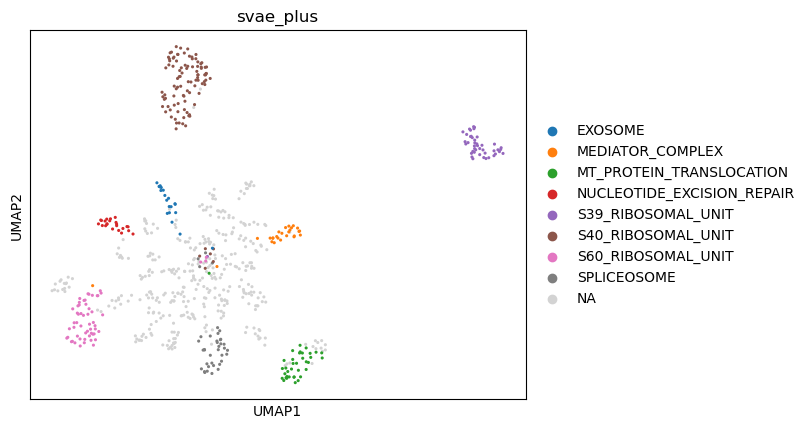

<Figure size 640x480 with 0 Axes>

         Falling back to preprocessing with `sc.pp.pca` and default params.


/Users/michaelbereket/opt/miniconda3/envs/sams_vae3/lib/python3.9/site-packages/anndata/_core/anndata.py:522: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  warnings.warn(
/Users/michaelbereket/opt/miniconda3/envs/sams_vae3/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1207: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):
/Users/michaelbereket/opt/miniconda3/envs/sams_vae3/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1216: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/michaelbereket/opt/miniconda3/envs/sams_vae3/lib/python3.9/site-

<Figure size 500x500 with 0 Axes>

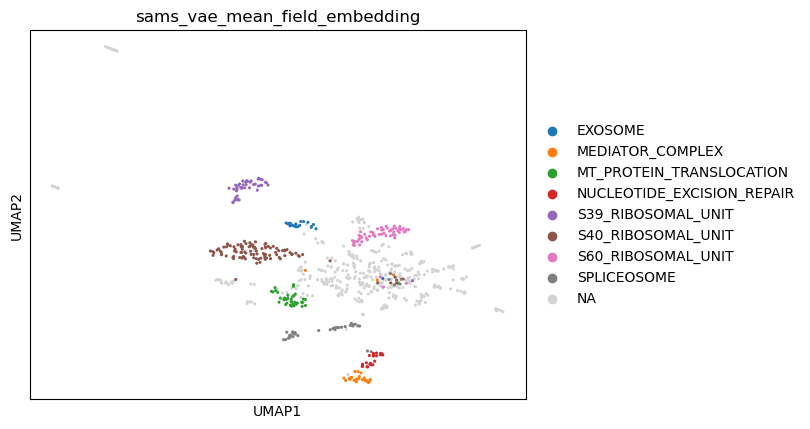

<Figure size 640x480 with 0 Axes>

         Falling back to preprocessing with `sc.pp.pca` and default params.


/Users/michaelbereket/opt/miniconda3/envs/sams_vae3/lib/python3.9/site-packages/anndata/_core/anndata.py:522: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  warnings.warn(
/Users/michaelbereket/opt/miniconda3/envs/sams_vae3/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1207: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):
/Users/michaelbereket/opt/miniconda3/envs/sams_vae3/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1216: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/michaelbereket/opt/miniconda3/envs/sams_vae3/lib/python3.9/site-

<Figure size 500x500 with 0 Axes>

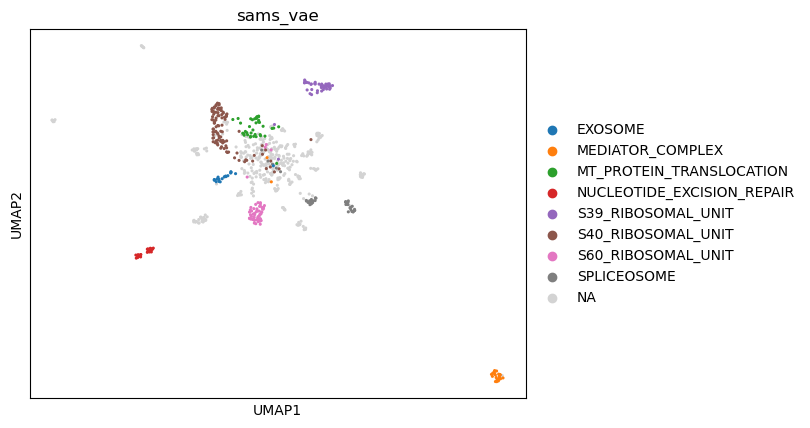

<Figure size 640x480 with 0 Axes>

         Falling back to preprocessing with `sc.pp.pca` and default params.


/Users/michaelbereket/opt/miniconda3/envs/sams_vae3/lib/python3.9/site-packages/anndata/_core/anndata.py:522: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  warnings.warn(
/Users/michaelbereket/opt/miniconda3/envs/sams_vae3/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1207: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):
/Users/michaelbereket/opt/miniconda3/envs/sams_vae3/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1216: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/michaelbereket/opt/miniconda3/envs/sams_vae3/lib/python3.9/site-

<Figure size 500x500 with 0 Axes>

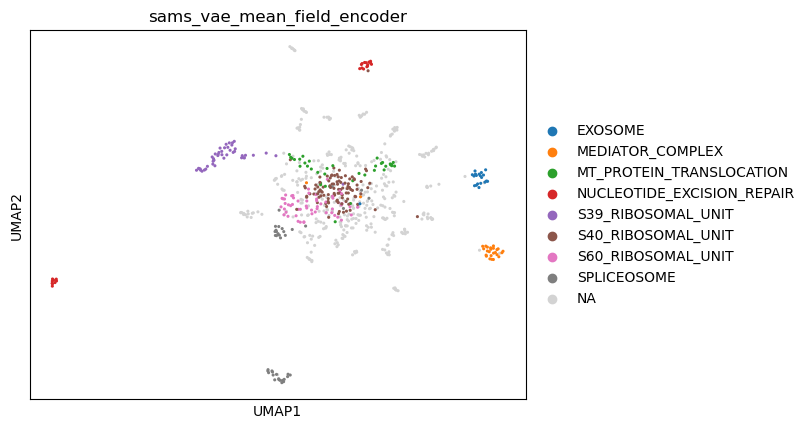

<Figure size 640x480 with 0 Axes>

In [25]:
for k in latent_var_dict:
    if latent_var_dict[k]["E_mean"] is not None:
        adata = anndata.AnnData(obs=t_var.copy(), X=latent_var_dict[k]["E_mean"])
        sc.pp.neighbors(adata, n_neighbors=15, n_pcs=50)
        sc.tl.umap(adata)
        plt.figure(figsize=(5,5))
        sc.pl.umap(adata, color=["pathway"], s=20, title=k)
        plt.show(plt.gcf())
        plt.close()

In [26]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split

In [27]:
def get_mask_pathway_prediction_stats(mask_probs, t_var, n_splits=10):
    idx = (~pd.isna(t_var["pathway"])).to_numpy()
    mask = (mask_probs > 0.5).astype(np.float32)[idx]
    y_df = pd.get_dummies(t_var[idx]["pathway"])
    y = y_df.to_numpy().astype(np.float32)
    stats = defaultdict(list)
    for seed in range(n_splits):
        train_idx, val_idx = train_test_split(np.arange(y.shape[0]), test_size=0.3, random_state=seed)
        mask_tr = mask[train_idx]
        mask_val = mask[val_idx]
        y_tr = y[train_idx]
        y_val = y[val_idx]
        classifier = RandomForestClassifier(random_state=seed).fit(mask_tr, y_tr)
        stats["split_seed"].append(seed)
        stats["acc_train"].append(classifier.score(mask_tr, y_tr))
        stats["acc_val"].append(classifier.score(mask_val, y_val))
    stats = pd.DataFrame(stats)
    return stats

In [28]:
mask_stats_list = []
for k in latent_var_dict:
    if latent_var_dict[k]["mask_probs"] is not None:
        mask_stats = get_mask_pathway_prediction_stats(latent_var_dict[k]["mask_probs"], t_var)
        mask_stats["model_key"] = k
        mask_stats_list.append(mask_stats)
mask_stats = pd.concat(mask_stats_list)

In [29]:
mask_stats.groupby("model_key").agg(["mean", "std", "count"])

split_seed                 \
                                                       mean      std count   
model_key                                                                    
sams_vae                                                4.5  3.02765    10   
sams_vae_mean_field_embedding                           4.5  3.02765    10   
sams_vae_mean_field_embedding_mean_field_encoder        4.5  3.02765    10   
sams_vae_mean_field_encoder                             4.5  3.02765    10   
svae_plus                                               4.5  3.02765    10   

                                                 acc_train                  \
                                                      mean       std count   
model_key                                                                    
sams_vae                                          0.985892  0.004460    10   
sams_vae_mean_field_embedding                     0.977593  0.006247    10   
sams_vae_mean_field_embedding_mean_field_encoder  0.877178  0.009819    10   
sams_vae_mean_field_encoder                       0.885062  0.009593    10   
svae_plus                                         0.973859  0.006790    10   

                                                   acc_val                  
                                                      mean       std count  
model_key                                                                   
sams_vae                                          0.883654  0.038314    10  
sams_vae_mean_field_embedding                     0.882692  0.037323    10  
sams_vae_mean_field_embedding_mean_field_encoder  0.807692  0.026430    10  
sams_vae_mean_field_encoder                       0.765385  0.031469    10  
svae_plus                                         0.775000  0.039045    10